# Satellite-Based Geographical Poverty Predictions

In [4]:
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, random_split
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.metrics.functional import get_stats, iou_score
from tqdm import tqdm
import numpy as np
import seaborn as sns

from dataset import SatelliteImageDataset
from res_unet_a import ResUNetA
from utils import (
    one_hot_to_image,
    plot_prediction,
    compute_accuracy,
    class_index_to_one_hot,
    class_index_to_image,
    get_color_patches,
    print_iou,
    get_iou_by_class
)


c:\Program Files\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Load the dataset and split it into training and testing set

In [6]:
dataset = SatelliteImageDataset(
    image_dir='data/images',
    mask_dir='data/masks'
)

In [7]:
gen = torch.Generator()
gen.manual_seed(0)

train_set, test_set = random_split(dataset, [0.8, 0.2], generator=gen)

Visulize the 1st image in the dataset

In [8]:
img, mask = dataset[0]

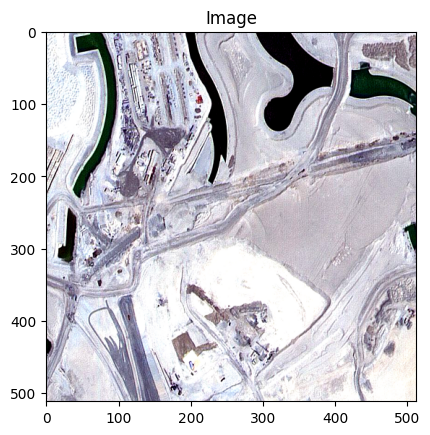

In [9]:
plt.imshow(img.permute(1, 2, 0))
plt.title('Image')
plt.show()

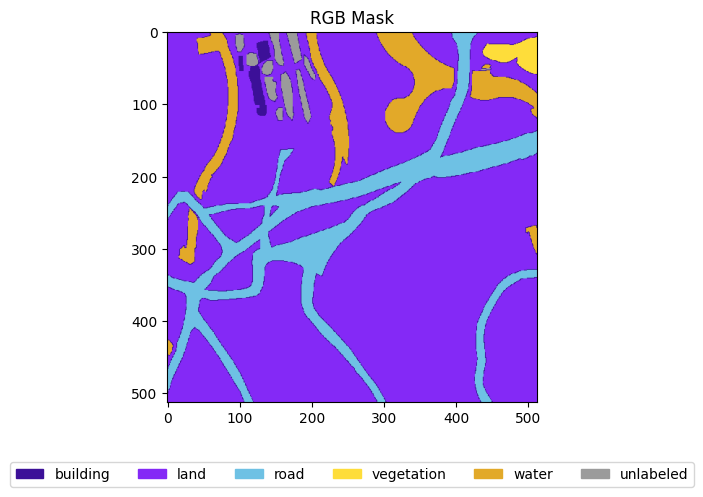

In [10]:
mask_rgb = class_index_to_image(torch.unsqueeze(mask, 0), dataset.color_map)[0]
plt.imshow(mask_rgb.permute(1, 2, 0))

patches = get_color_patches(dataset.color_map, dataset.mask_labels)
plt.legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.25), fontsize=10, ncol=6)

plt.title('RGB Mask')
plt.show()

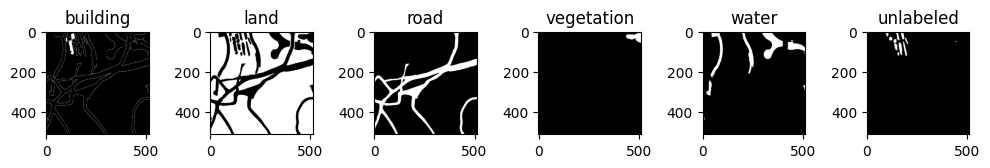

In [11]:
fig, axes = plt.subplots(1, 6, figsize=(10, 8))
mask = class_index_to_one_hot(mask, dataset.color_map)

for i in range(6):
    axes[i].imshow(mask[i], cmap='gray')
    axes[i].set_title(dataset.mask_labels[i])

plt.tight_layout()
plt.show()

In [12]:
gen = torch.Generator()
gen.manual_seed(0)

train_loader = DataLoader(train_set, shuffle=True, generator=gen)
test_loader = DataLoader(test_set)

Define the hyperparameters, optimizers and criterion function for the model 

In [13]:
LEARNING_RATE = 3e-4
EPOCHS = 100

In [14]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = ResUNetA(in_channels=3, out_channels=6).to(device)

In [15]:
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = DiceLoss('multiclass').to(device)

Train the model

Epoch 1:


Training: 100%|██████████| 96/96 [14:34<00:00,  9.11s/it]


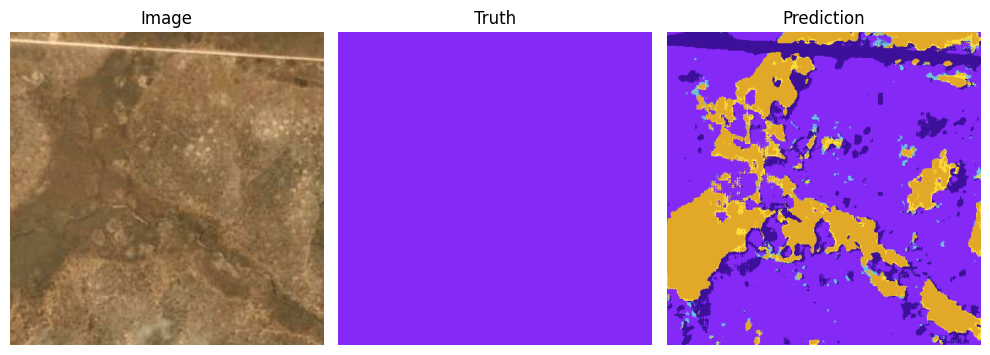

Accuracy: 0.4990 | Loss: 0.5335


Epoch 2:


Training: 100%|██████████| 96/96 [14:21<00:00,  8.97s/it]


Accuracy: 0.5657 | Loss: 0.4700


Epoch 3:


Training: 100%|██████████| 96/96 [14:19<00:00,  8.96s/it]


Accuracy: 0.5595 | Loss: 0.4423


Epoch 4:


Training: 100%|██████████| 96/96 [14:26<00:00,  9.02s/it]


Accuracy: 0.5801 | Loss: 0.4203


Epoch 5:


Training: 100%|██████████| 96/96 [14:20<00:00,  8.96s/it]


Accuracy: 0.5961 | Loss: 0.4063


Epoch 6:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.6061 | Loss: 0.3989


Epoch 7:


Training: 100%|██████████| 96/96 [14:21<00:00,  8.97s/it]


Accuracy: 0.6189 | Loss: 0.3892


Epoch 8:


Training: 100%|██████████| 96/96 [14:23<00:00,  9.00s/it]


Accuracy: 0.6482 | Loss: 0.3814


Epoch 9:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.6654 | Loss: 0.3700


Epoch 10:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.98s/it]


Accuracy: 0.6650 | Loss: 0.3693


Epoch 11:


Training: 100%|██████████| 96/96 [14:28<00:00,  9.05s/it]


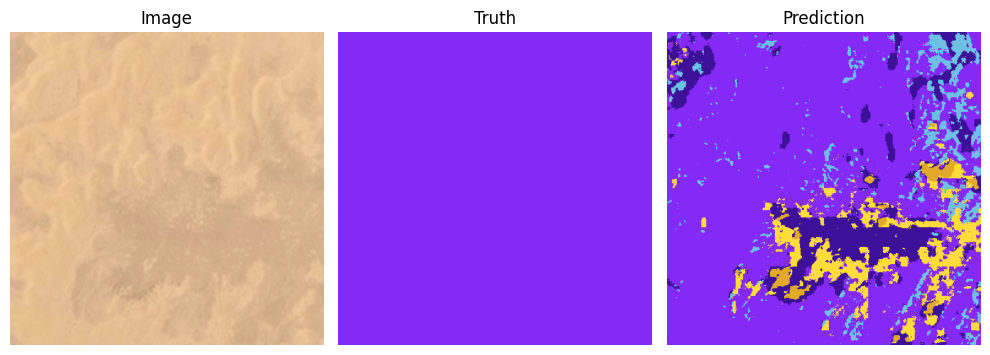

Accuracy: 0.6935 | Loss: 0.3604


Epoch 12:


Training: 100%|██████████| 96/96 [14:27<00:00,  9.04s/it]


Accuracy: 0.7110 | Loss: 0.3506


Epoch 13:


Training: 100%|██████████| 96/96 [14:31<00:00,  9.08s/it]


Accuracy: 0.6977 | Loss: 0.3539


Epoch 14:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.7078 | Loss: 0.3499


Epoch 15:


Training: 100%|██████████| 96/96 [14:20<00:00,  8.97s/it]


Accuracy: 0.7213 | Loss: 0.3405


Epoch 16:


Training: 100%|██████████| 96/96 [14:23<00:00,  8.99s/it]


Accuracy: 0.7348 | Loss: 0.3357


Epoch 17:


Training: 100%|██████████| 96/96 [14:21<00:00,  8.97s/it]


Accuracy: 0.7224 | Loss: 0.3359


Epoch 18:


Training: 100%|██████████| 96/96 [14:24<00:00,  9.01s/it]


Accuracy: 0.7382 | Loss: 0.3329


Epoch 19:


Training: 100%|██████████| 96/96 [14:21<00:00,  8.98s/it]


Accuracy: 0.7388 | Loss: 0.3303


Epoch 20:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.98s/it]


Accuracy: 0.7440 | Loss: 0.3241


Epoch 21:


Training: 100%|██████████| 96/96 [14:26<00:00,  9.03s/it]


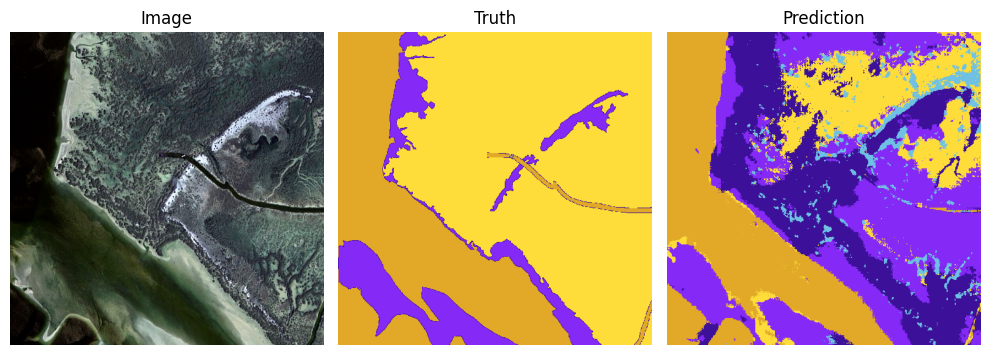

Accuracy: 0.7642 | Loss: 0.3147


Epoch 22:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.7477 | Loss: 0.3206


Epoch 23:


Training: 100%|██████████| 96/96 [14:24<00:00,  9.01s/it]


Accuracy: 0.7495 | Loss: 0.3158


Epoch 24:


Training: 100%|██████████| 96/96 [14:46<00:00,  9.23s/it]


Accuracy: 0.7663 | Loss: 0.3081


Epoch 25:


Training: 100%|██████████| 96/96 [14:23<00:00,  8.99s/it]


Accuracy: 0.7727 | Loss: 0.3083


Epoch 26:


Training: 100%|██████████| 96/96 [14:23<00:00,  9.00s/it]


Accuracy: 0.7778 | Loss: 0.3009


Epoch 27:


Training: 100%|██████████| 96/96 [14:23<00:00,  8.99s/it]


Accuracy: 0.7808 | Loss: 0.2975


Epoch 28:


Training: 100%|██████████| 96/96 [14:25<00:00,  9.02s/it]


Accuracy: 0.7813 | Loss: 0.2957


Epoch 29:


Training: 100%|██████████| 96/96 [14:21<00:00,  8.97s/it]


Accuracy: 0.7788 | Loss: 0.3009


Epoch 30:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.7704 | Loss: 0.2974


Epoch 31:


Training: 100%|██████████| 96/96 [14:20<00:00,  8.97s/it]


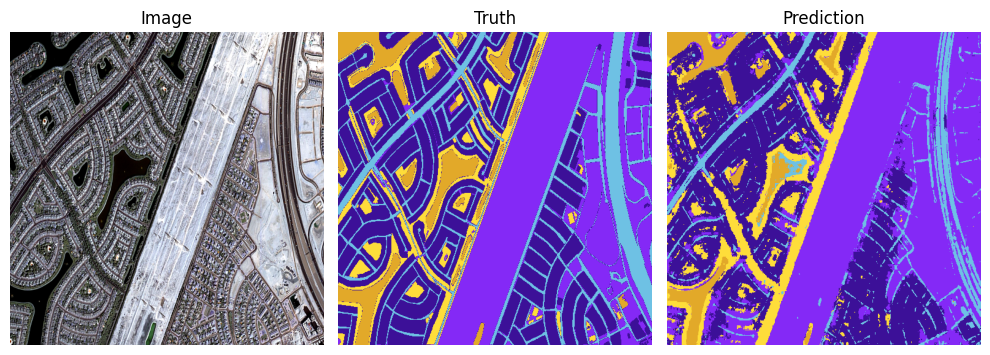

Accuracy: 0.7861 | Loss: 0.2875


Epoch 32:


Training: 100%|██████████| 96/96 [14:22<00:00,  8.99s/it]


Accuracy: 0.7773 | Loss: 0.2956


Epoch 33:


Training: 100%|██████████| 96/96 [17:24<00:00, 10.88s/it]


Accuracy: 0.7869 | Loss: 0.2907


Epoch 34:


Training: 100%|██████████| 96/96 [16:46<00:00, 10.49s/it]


Accuracy: 0.7826 | Loss: 0.2953


Epoch 35:


Training: 100%|██████████| 96/96 [16:55<00:00, 10.58s/it]


Accuracy: 0.8001 | Loss: 0.2818


Epoch 36:


Training: 100%|██████████| 96/96 [16:49<00:00, 10.52s/it]


Accuracy: 0.7933 | Loss: 0.2829


Epoch 37:


Training: 100%|██████████| 96/96 [16:05<00:00, 10.06s/it]


Accuracy: 0.7975 | Loss: 0.2833


Epoch 38:


Training: 100%|██████████| 96/96 [15:56<00:00,  9.96s/it]


Accuracy: 0.8052 | Loss: 0.2770


Epoch 39:


Training: 100%|██████████| 96/96 [16:09<00:00, 10.10s/it]


Accuracy: 0.8122 | Loss: 0.2688


Epoch 40:


Training: 100%|██████████| 96/96 [16:41<00:00, 10.43s/it]


Accuracy: 0.8083 | Loss: 0.2713


Epoch 41:


Training: 100%|██████████| 96/96 [17:38<00:00, 11.02s/it]


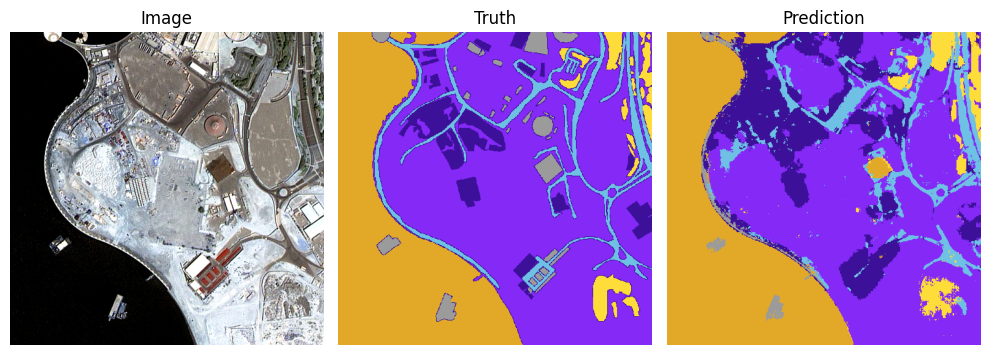

Accuracy: 0.8157 | Loss: 0.2641


Epoch 42:


Training: 100%|██████████| 96/96 [19:11<00:00, 11.99s/it]


Accuracy: 0.8112 | Loss: 0.2700


Epoch 43:


Training: 100%|██████████| 96/96 [16:43<00:00, 10.46s/it]


Accuracy: 0.8063 | Loss: 0.2680


Epoch 44:


Training: 100%|██████████| 96/96 [14:44<00:00,  9.21s/it]


Accuracy: 0.8079 | Loss: 0.2699


Epoch 45:


Training: 100%|██████████| 96/96 [14:48<00:00,  9.26s/it]


Accuracy: 0.8060 | Loss: 0.2695


Epoch 46:


Training: 100%|██████████| 96/96 [14:54<00:00,  9.32s/it]


Accuracy: 0.8224 | Loss: 0.2602


Epoch 47:


Training: 100%|██████████| 96/96 [14:28<00:00,  9.05s/it]


Accuracy: 0.8266 | Loss: 0.2539


Epoch 48:


Training: 100%|██████████| 96/96 [14:26<00:00,  9.02s/it]


Accuracy: 0.8313 | Loss: 0.2539


Epoch 49:


Training: 100%|██████████| 96/96 [15:14<00:00,  9.52s/it]


Accuracy: 0.8274 | Loss: 0.2513


Epoch 50:


Training: 100%|██████████| 96/96 [14:29<00:00,  9.05s/it]


Accuracy: 0.8301 | Loss: 0.2520


Epoch 51:


Training: 100%|██████████| 96/96 [13:59<00:00,  8.75s/it]


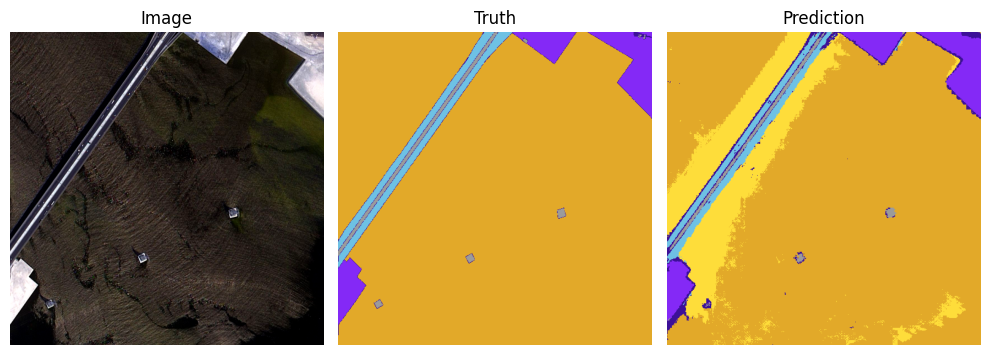

Accuracy: 0.8221 | Loss: 0.2550


Epoch 52:


Training: 100%|██████████| 96/96 [14:42<00:00,  9.19s/it]


Accuracy: 0.8335 | Loss: 0.2480


Epoch 53:


Training: 100%|██████████| 96/96 [14:32<00:00,  9.09s/it]


Accuracy: 0.8354 | Loss: 0.2484


Epoch 54:


Training: 100%|██████████| 96/96 [14:45<00:00,  9.22s/it]


Accuracy: 0.8323 | Loss: 0.2476


Epoch 55:


Training: 100%|██████████| 96/96 [14:33<00:00,  9.09s/it]


Accuracy: 0.8332 | Loss: 0.2492


Epoch 56:


Training: 100%|██████████| 96/96 [14:41<00:00,  9.18s/it]


Accuracy: 0.8395 | Loss: 0.2421


Epoch 57:


Training: 100%|██████████| 96/96 [14:41<00:00,  9.19s/it]


Accuracy: 0.8416 | Loss: 0.2380


Epoch 58:


Training: 100%|██████████| 96/96 [14:39<00:00,  9.17s/it]


Accuracy: 0.8445 | Loss: 0.2358


Epoch 59:


Training: 100%|██████████| 96/96 [14:45<00:00,  9.22s/it]


Accuracy: 0.8323 | Loss: 0.2478


Epoch 60:


Training: 100%|██████████| 96/96 [14:50<00:00,  9.27s/it]


Accuracy: 0.8442 | Loss: 0.2357


Epoch 61:


Training: 100%|██████████| 96/96 [14:51<00:00,  9.29s/it]


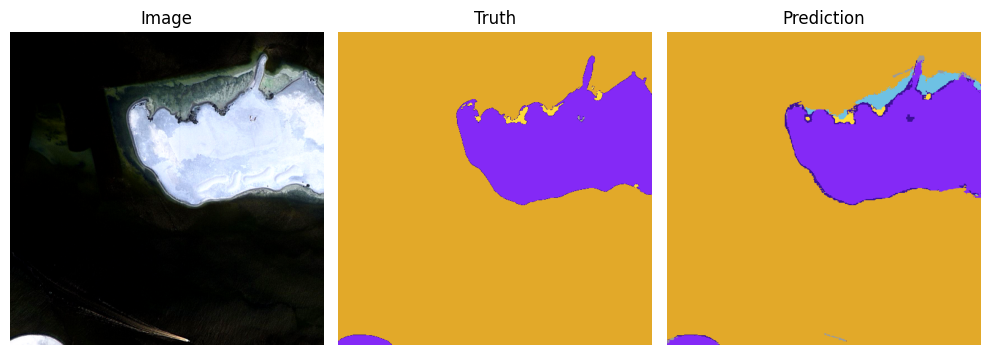

Accuracy: 0.8464 | Loss: 0.2360


Epoch 62:


Training: 100%|██████████| 96/96 [15:09<00:00,  9.47s/it]


Accuracy: 0.8431 | Loss: 0.2382


Epoch 63:


Training: 100%|██████████| 96/96 [15:01<00:00,  9.39s/it]


Accuracy: 0.8487 | Loss: 0.2292


Epoch 64:


Training: 100%|██████████| 96/96 [14:52<00:00,  9.29s/it]


Accuracy: 0.8486 | Loss: 0.2313


Epoch 65:


Training: 100%|██████████| 96/96 [14:48<00:00,  9.26s/it]


Accuracy: 0.8432 | Loss: 0.2360


Epoch 66:


Training: 100%|██████████| 96/96 [14:50<00:00,  9.28s/it]


Accuracy: 0.8488 | Loss: 0.2319


Epoch 67:


Training: 100%|██████████| 96/96 [14:50<00:00,  9.28s/it]


Accuracy: 0.8439 | Loss: 0.2332


Epoch 68:


Training: 100%|██████████| 96/96 [14:45<00:00,  9.23s/it]


Accuracy: 0.8488 | Loss: 0.2276


Epoch 69:


Training: 100%|██████████| 96/96 [14:59<00:00,  9.37s/it]


Accuracy: 0.8528 | Loss: 0.2284


Epoch 70:


Training: 100%|██████████| 96/96 [14:48<00:00,  9.26s/it]


Accuracy: 0.8409 | Loss: 0.2309


Epoch 71:


Training: 100%|██████████| 96/96 [14:11<00:00,  8.87s/it]


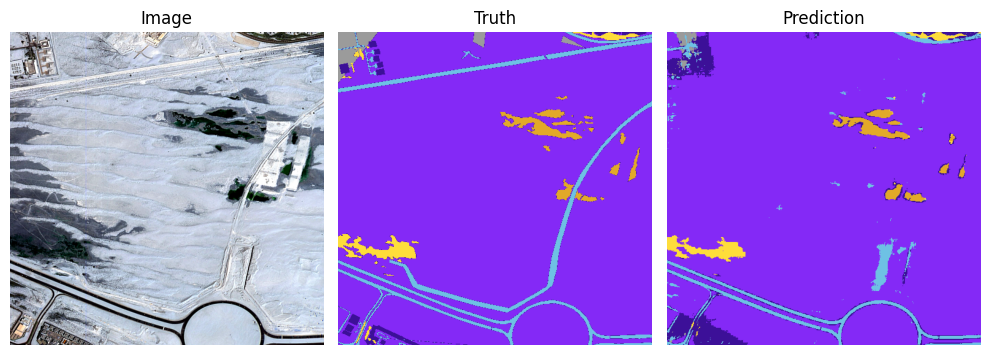

Accuracy: 0.8561 | Loss: 0.2216


Epoch 72:


Training: 100%|██████████| 96/96 [13:44<00:00,  8.58s/it]


Accuracy: 0.8612 | Loss: 0.2183


Epoch 73:


Training: 100%|██████████| 96/96 [14:02<00:00,  8.77s/it]


Accuracy: 0.8631 | Loss: 0.2172


Epoch 74:


Training: 100%|██████████| 96/96 [14:40<00:00,  9.17s/it]


Accuracy: 0.8601 | Loss: 0.2174


Epoch 75:


Training: 100%|██████████| 96/96 [14:56<00:00,  9.34s/it]


Accuracy: 0.8593 | Loss: 0.2204


Epoch 76:


Training: 100%|██████████| 96/96 [14:47<00:00,  9.25s/it]


Accuracy: 0.8577 | Loss: 0.2202


Epoch 77:


Training: 100%|██████████| 96/96 [14:57<00:00,  9.34s/it]


Accuracy: 0.8594 | Loss: 0.2161


Epoch 78:


Training: 100%|██████████| 96/96 [14:54<00:00,  9.32s/it]


Accuracy: 0.8606 | Loss: 0.2137


Epoch 79:


Training: 100%|██████████| 96/96 [15:10<00:00,  9.48s/it]


Accuracy: 0.8622 | Loss: 0.2156


Epoch 80:


Training: 100%|██████████| 96/96 [14:56<00:00,  9.34s/it]


Accuracy: 0.8617 | Loss: 0.2143


Epoch 81:


Training: 100%|██████████| 96/96 [18:55<00:00, 11.83s/it]


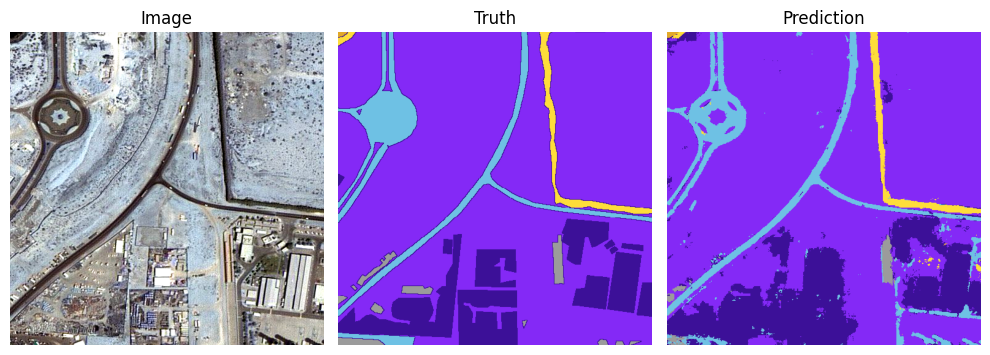

Accuracy: 0.8622 | Loss: 0.2188


Epoch 82:


Training: 100%|██████████| 96/96 [21:08<00:00, 13.21s/it]


Accuracy: 0.8582 | Loss: 0.2220


Epoch 83:


Training: 100%|██████████| 96/96 [18:54<00:00, 11.82s/it]


Accuracy: 0.8597 | Loss: 0.2215


Epoch 84:


Training: 100%|██████████| 96/96 [15:58<00:00,  9.99s/it]


Accuracy: 0.8565 | Loss: 0.2222


Epoch 85:


Training: 100%|██████████| 96/96 [15:47<00:00,  9.87s/it]


Accuracy: 0.8684 | Loss: 0.2072


Epoch 86:


Training: 100%|██████████| 96/96 [17:02<00:00, 10.66s/it]


Accuracy: 0.8687 | Loss: 0.2093


Epoch 87:


Training: 100%|██████████| 96/96 [15:01<00:00,  9.39s/it]


Accuracy: 0.8549 | Loss: 0.2174


Epoch 88:


Training: 100%|██████████| 96/96 [15:34<00:00,  9.74s/it]


Accuracy: 0.8736 | Loss: 0.2047


Epoch 89:


Training: 100%|██████████| 96/96 [15:27<00:00,  9.66s/it]


Accuracy: 0.8715 | Loss: 0.2047


Epoch 90:


Training: 100%|██████████| 96/96 [15:23<00:00,  9.62s/it]


Accuracy: 0.8751 | Loss: 0.2017


Epoch 91:


Training: 100%|██████████| 96/96 [14:54<00:00,  9.32s/it]


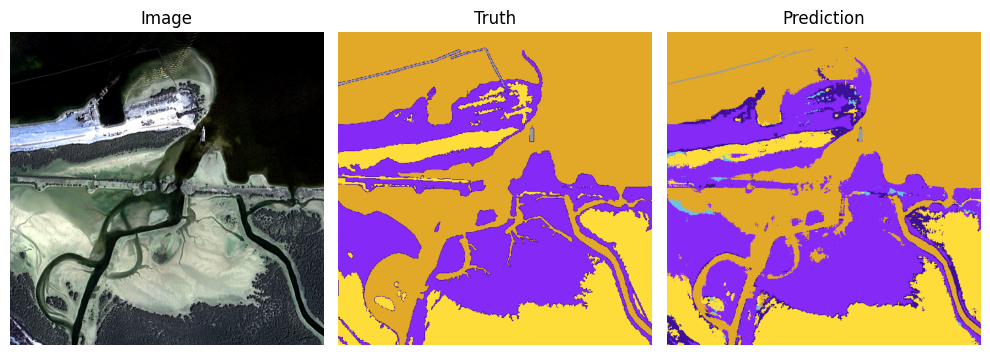

Accuracy: 0.8546 | Loss: 0.2183


Epoch 92:


Training: 100%|██████████| 96/96 [15:01<00:00,  9.39s/it]


Accuracy: 0.8380 | Loss: 0.2401


Epoch 93:


Training: 100%|██████████| 96/96 [15:37<00:00,  9.76s/it]


Accuracy: 0.8575 | Loss: 0.2205


Epoch 94:


Training: 100%|██████████| 96/96 [15:38<00:00,  9.78s/it]


Accuracy: 0.8693 | Loss: 0.2089


Epoch 95:


Training: 100%|██████████| 96/96 [15:05<00:00,  9.44s/it]


Accuracy: 0.8774 | Loss: 0.2001


Epoch 96:


Training: 100%|██████████| 96/96 [15:02<00:00,  9.40s/it]


Accuracy: 0.8805 | Loss: 0.1954


Epoch 97:


Training: 100%|██████████| 96/96 [15:02<00:00,  9.41s/it]


Accuracy: 0.8816 | Loss: 0.1949


Epoch 98:


Training: 100%|██████████| 96/96 [15:01<00:00,  9.39s/it]


Accuracy: 0.8779 | Loss: 0.1991


Epoch 99:


Training: 100%|██████████| 96/96 [14:59<00:00,  9.36s/it]


Accuracy: 0.8694 | Loss: 0.2057


Epoch 100:


Training: 100%|██████████| 96/96 [14:58<00:00,  9.36s/it]

Accuracy: 0.8677 | Loss: 0.2110




In [16]:
loss_list = []
acc_list = []

for epoch in range(EPOCHS):
    print(f'Epoch {epoch + 1}:')

    model.train()
    running_loss = 0
    running_acc = 0

    for x, y in tqdm(train_loader, desc='Training', colour='#00FF00'):
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)
        running_loss += loss.item()

        # compute the accuracy of the prediction
        running_acc += compute_accuracy(y, y_pred, device)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    if epoch % 10 == 0:
        # show first image in the last batch with matplotlib
        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, dataset.mask_labels)

    epoch_acc = running_acc / len(train_loader)
    epoch_loss = running_loss / len(train_loader)
    acc_list.append(epoch_acc)
    loss_list.append(epoch_loss)

    print(f'Accuracy: {epoch_acc:.4f} | Loss: {epoch_loss:.4f}')
    print('\n')


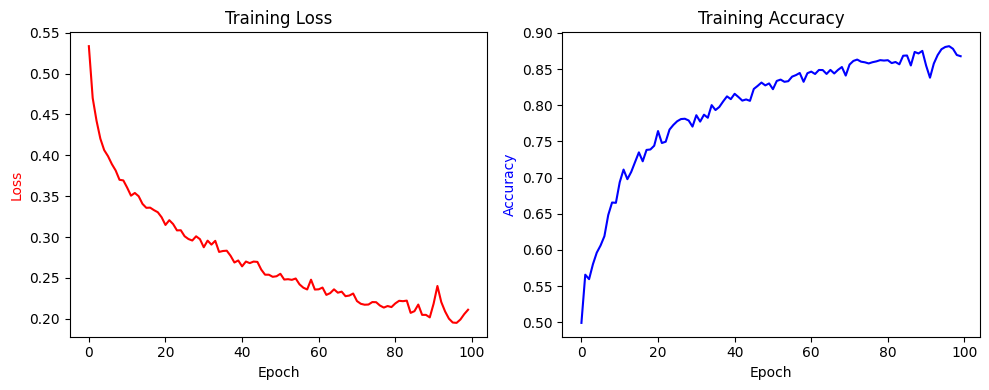

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].plot(loss_list, color='red')
axes[0].set_ylabel('Loss', color='red')
axes[0].set_xlabel('Epoch')
axes[0].set_title('Training Loss')

axes[1].plot(acc_list, color='blue')
axes[1].set_ylabel('Accuracy', color='blue')
axes[1].set_xlabel('Epoch')
axes[1].set_title('Training Accuracy')

plt.tight_layout()
plt.show()

Test the model with the test set

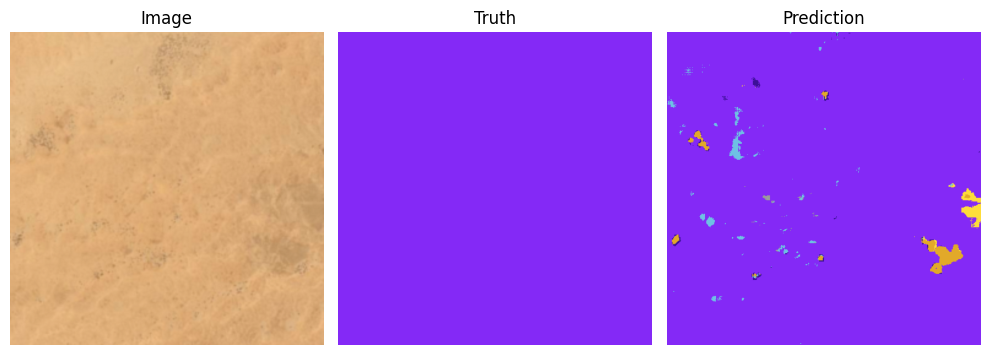

Accuracy: 0.9782 | Loss: 0.0019
IOU... land: 0.98 




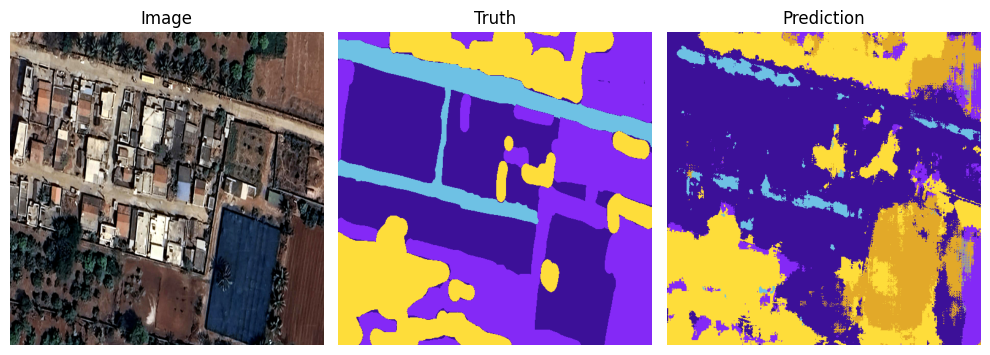

Accuracy: 0.5253 | Loss: 0.3279
IOU... building: 0.43 land: 0.15 road: 0.26 vegetation: 0.61 




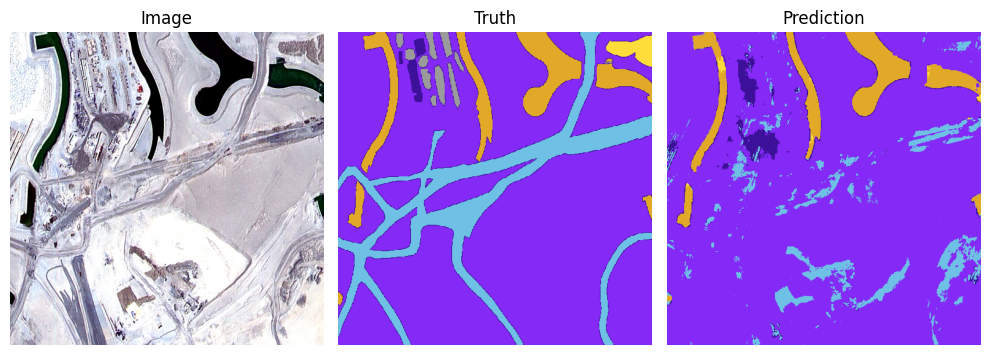

Accuracy: 0.7819 | Loss: 0.6229
IOU... building: 0.14 land: 0.77 road: 0.11 water: 0.89 




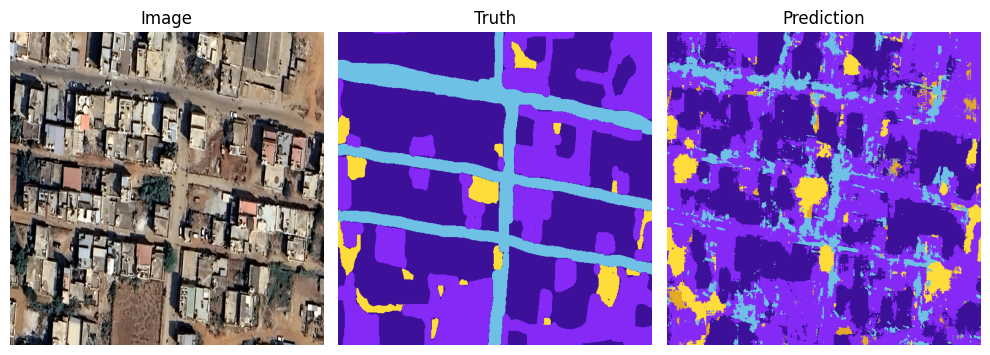

Accuracy: 0.5900 | Loss: 0.2966
IOU... building: 0.54 land: 0.38 road: 0.22 vegetation: 0.45 




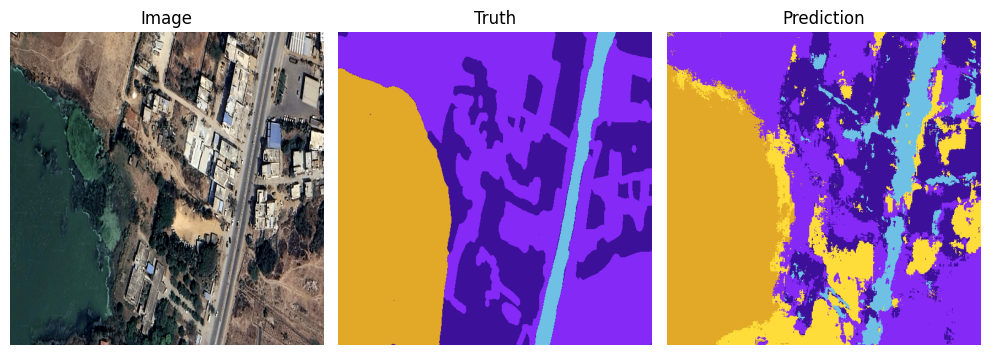

Accuracy: 0.6765 | Loss: 0.3691
IOU... building: 0.35 land: 0.56 road: 0.44 water: 0.91 




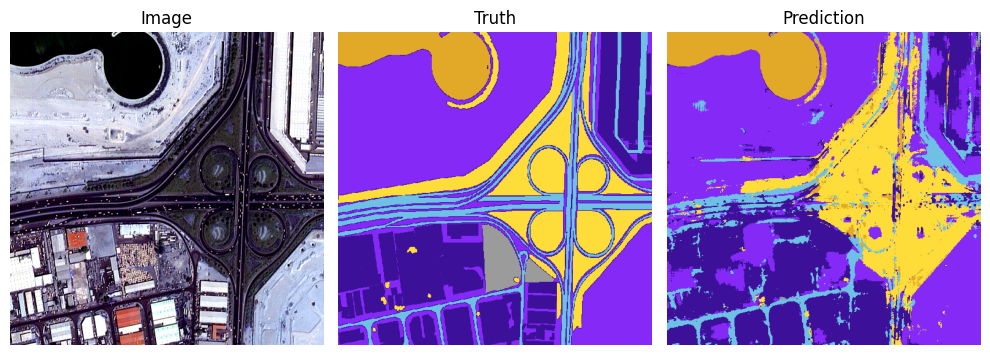

Accuracy: 0.6620 | Loss: 0.4504
IOU... building: 0.45 land: 0.58 road: 0.23 vegetation: 0.52 water: 0.79 




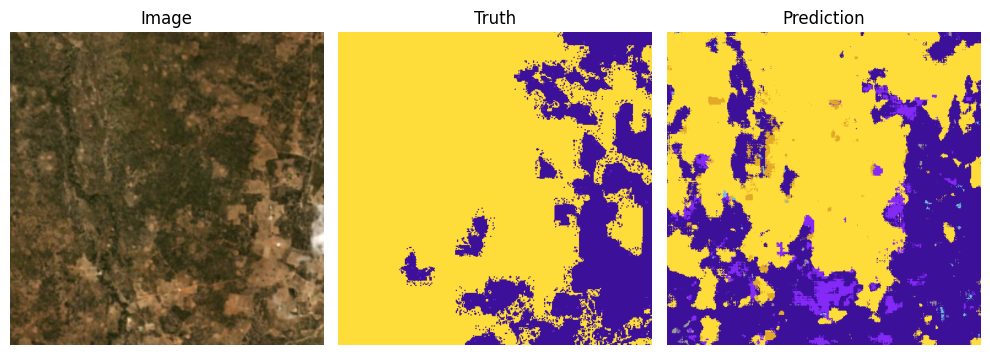

Accuracy: 0.6669 | Loss: 0.2822
IOU... building: 0.37 land: 0.00 vegetation: 0.62 




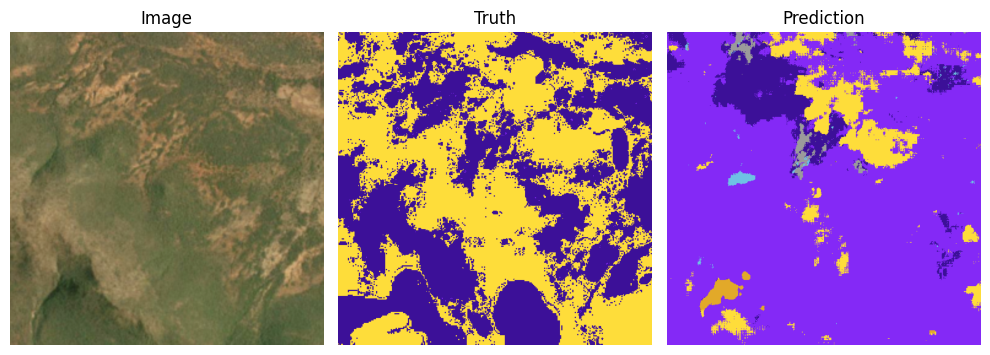

Accuracy: 0.1358 | Loss: 0.4219
IOU... building: 0.12 land: 0.00 vegetation: 0.14 




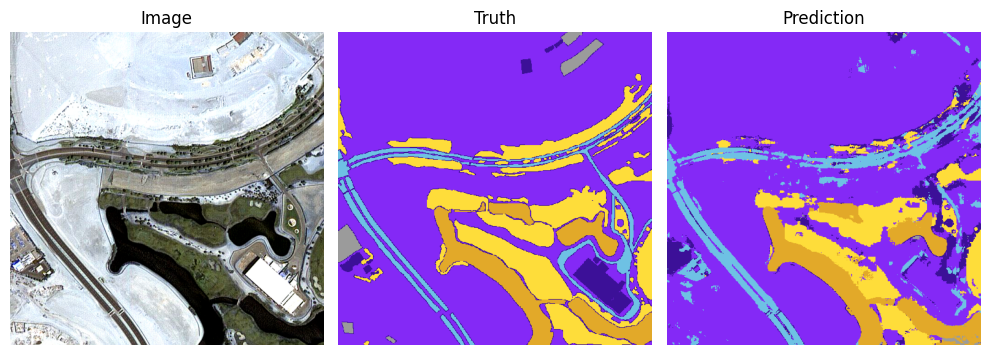

Accuracy: 0.7983 | Loss: 0.4649
IOU... building: 0.09 land: 0.81 road: 0.38 vegetation: 0.53 water: 0.84 




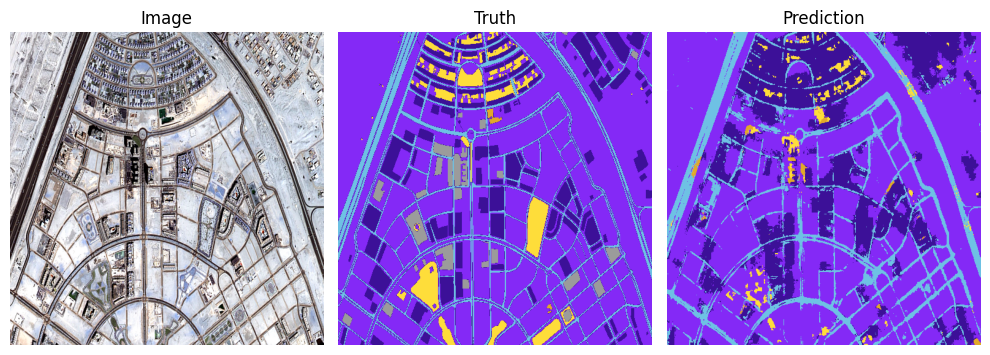

Accuracy: 0.7450 | Loss: 0.5672
IOU... building: 0.42 land: 0.75 road: 0.49 vegetation: 0.19 water: 0.10 unlabeled: 0.00 




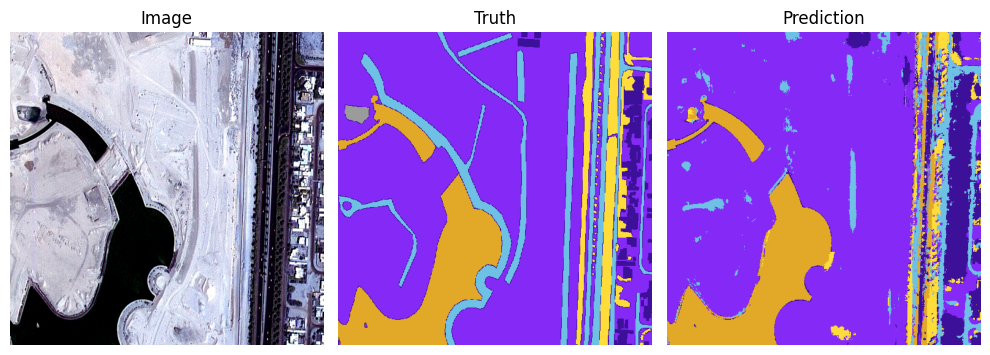

Accuracy: 0.7668 | Loss: 0.4976
IOU... building: 0.33 land: 0.78 road: 0.19 vegetation: 0.28 water: 0.80 




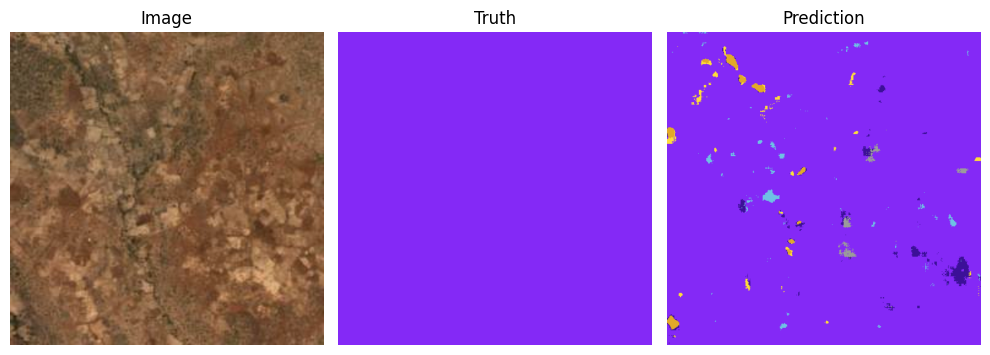

Accuracy: 0.9730 | Loss: 0.0024
IOU... land: 0.97 




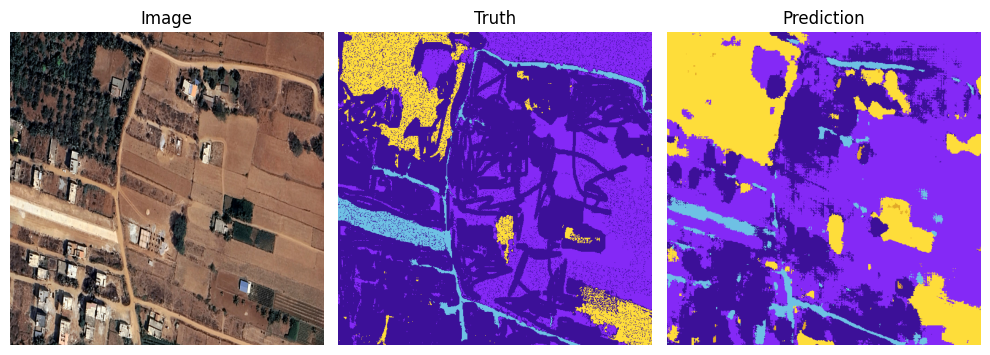

Accuracy: 0.5641 | Loss: 0.3019
IOU... building: 0.37 land: 0.43 road: 0.30 vegetation: 0.43 




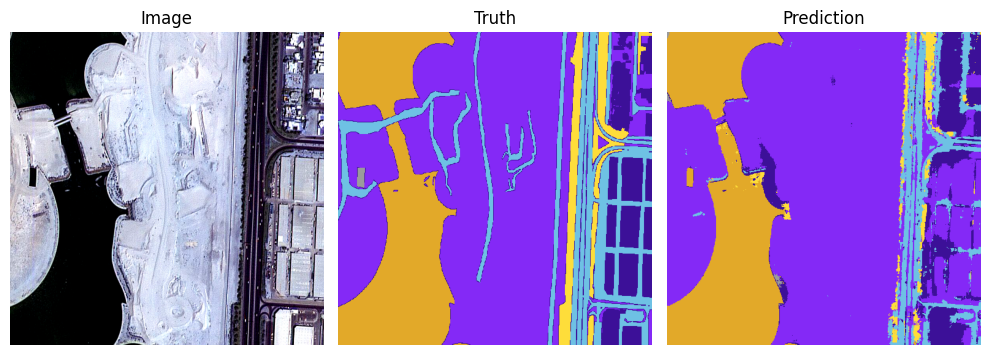

Accuracy: 0.7690 | Loss: 0.4769
IOU... building: 0.27 land: 0.72 road: 0.31 vegetation: 0.27 water: 0.97 




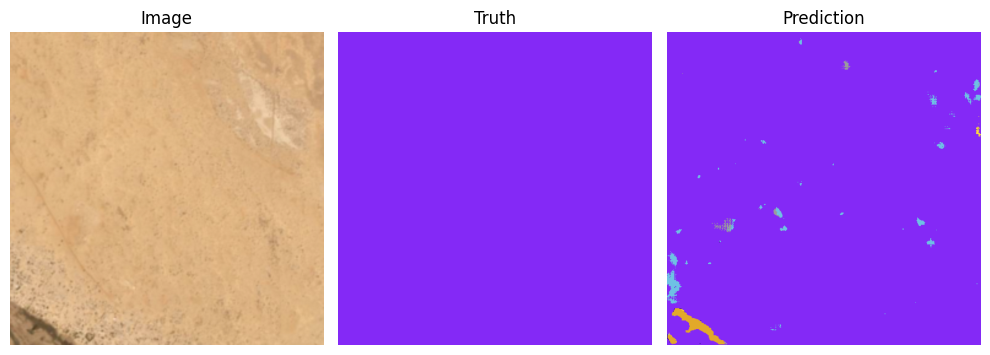

Accuracy: 0.9853 | Loss: 0.0013
IOU... land: 0.99 




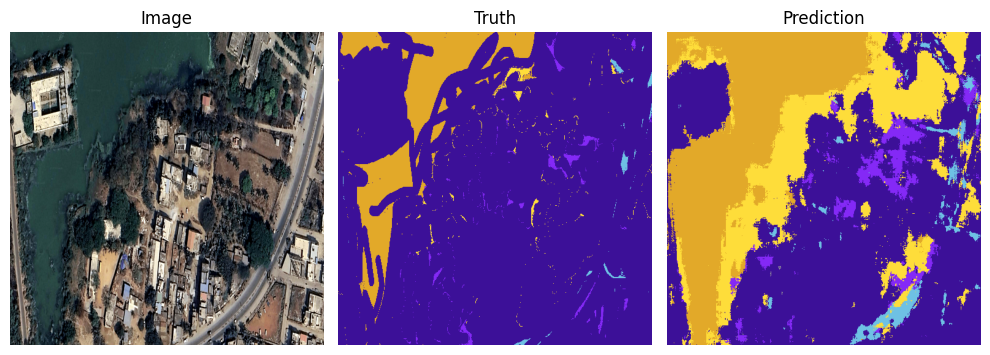

Accuracy: 0.6036 | Loss: 0.5824
IOU... building: 0.56 land: 0.05 road: 0.04 vegetation: 0.01 water: 0.42 




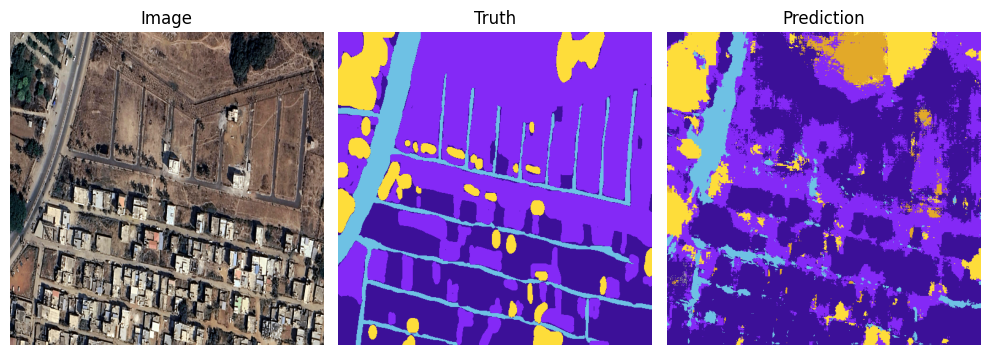

Accuracy: 0.5652 | Loss: 0.2818
IOU... building: 0.43 land: 0.37 road: 0.32 vegetation: 0.51 




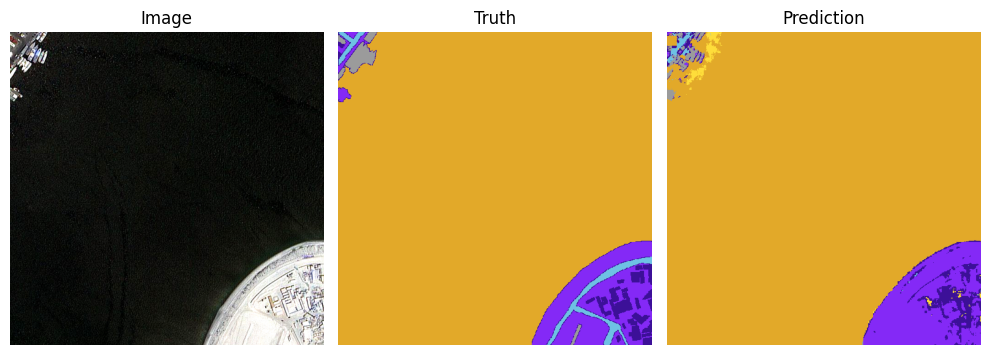

Accuracy: 0.9548 | Loss: 0.3541
IOU... building: 0.28 land: 0.61 road: 0.11 water: 0.99 unlabeled: 0.33 




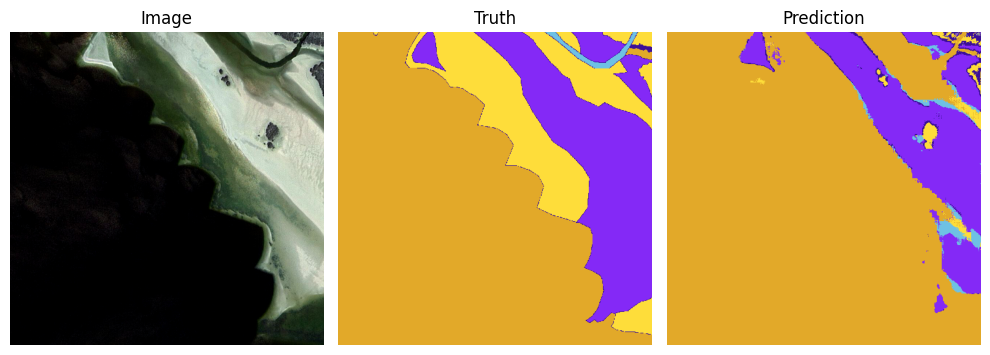

Accuracy: 0.7763 | Loss: 0.5141
IOU... building: 0.08 land: 0.71 vegetation: 0.04 water: 0.77 




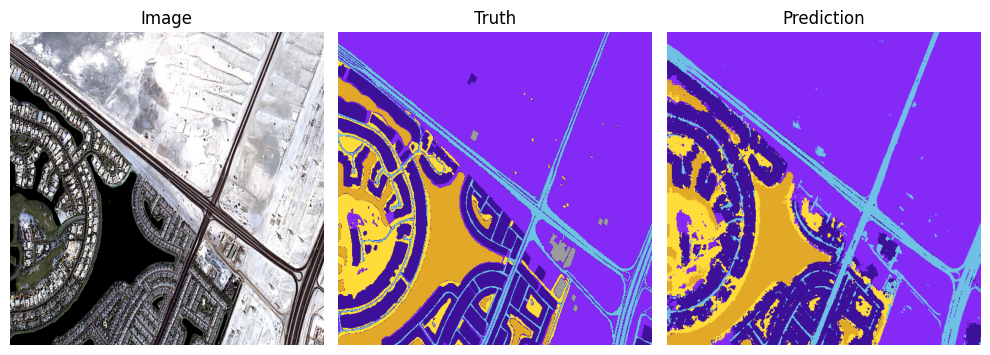

Accuracy: 0.8553 | Loss: 0.3384
IOU... building: 0.62 land: 0.90 road: 0.59 vegetation: 0.43 water: 0.84 




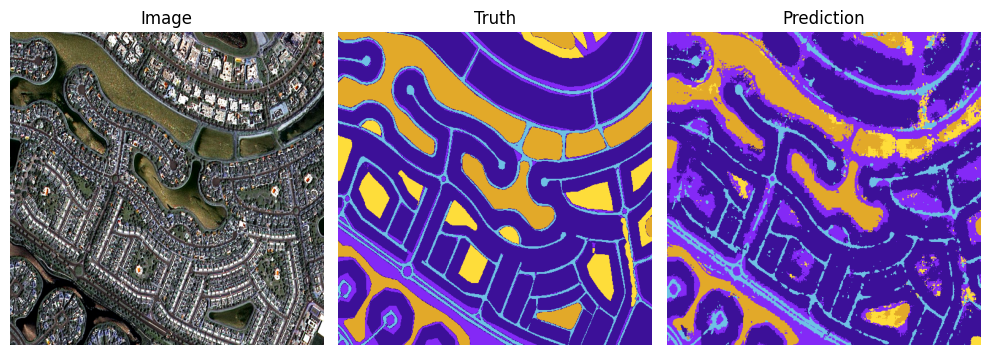

Accuracy: 0.7125 | Loss: 0.3811
IOU... building: 0.75 land: 0.22 road: 0.42 vegetation: 0.05 water: 0.70 




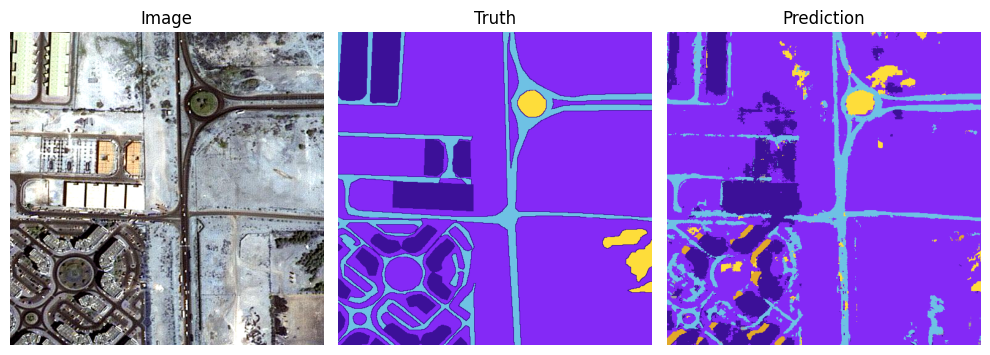

Accuracy: 0.8241 | Loss: 0.2366
IOU... building: 0.46 land: 0.82 road: 0.55 vegetation: 0.21 




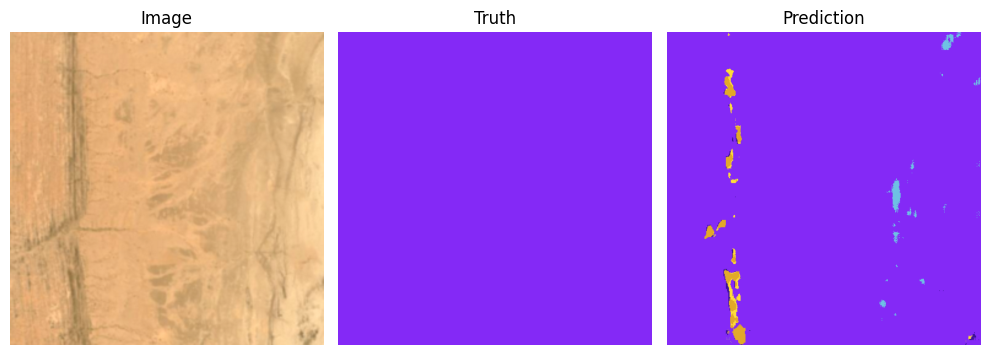

Accuracy: 0.9808 | Loss: 0.0017
IOU... land: 0.98 




In [18]:
test_acc_list = []
iou_list = torch.tensor([])
count = 0

with torch.no_grad():
    for x, y in test_loader:
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)

        # compute accuracy 
        acc = compute_accuracy(y, y_pred, device)
        test_acc_list.append(acc.item())

        # compute iou scores 
        y_pred_argmax = torch.argmax(y_pred, 1)
        tp, fp, fn, tn = get_stats(y_pred_argmax, y, mode='multiclass', num_classes=6)
        iou = iou_score(tp, fp, fn, tn)
        iou_list = torch.cat((iou_list, iou))

        # print predicted images
        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, dataset.mask_labels)

        count += 1

        print(f'Accuracy: {acc:.4f} | Loss: {loss:.4f}')
        print_iou(iou[0], dataset.mask_labels)
        print('\n')

In [19]:
mean_test_acc = np.mean(test_acc_list)
print(f'The mean test set accuracy is {mean_test_acc:.4f}')

The mean test set accuracy is 0.7344


In [20]:
iou_scores = get_iou_by_class(iou_list, avg=True)
print_iou(iou_scores, dataset.mask_labels)

mean_iou_scores = np.mean(iou_scores)
print(f'Mean IOU: {mean_iou_scores}')

IOU... building: 0.37 land: 0.59 road: 0.31 vegetation: 0.33 water: 0.75 unlabeled: 0.16 
Mean IOU: 0.41911638528108597


Save the model for future inference

In [21]:
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss_list': loss_list,
    'train_acc_list': acc_list,
    'test_acc': mean_test_acc,
    'test_iou_scores': get_iou_by_class(iou_list),
    'test_mean_iou_scores': get_iou_by_class(iou_list, avg=True)
}

In [22]:
torch.save(checkpoint, 'res_unet_a/res_unet_a_100ep_checkpoint.pth')

Visualize the model accuracy

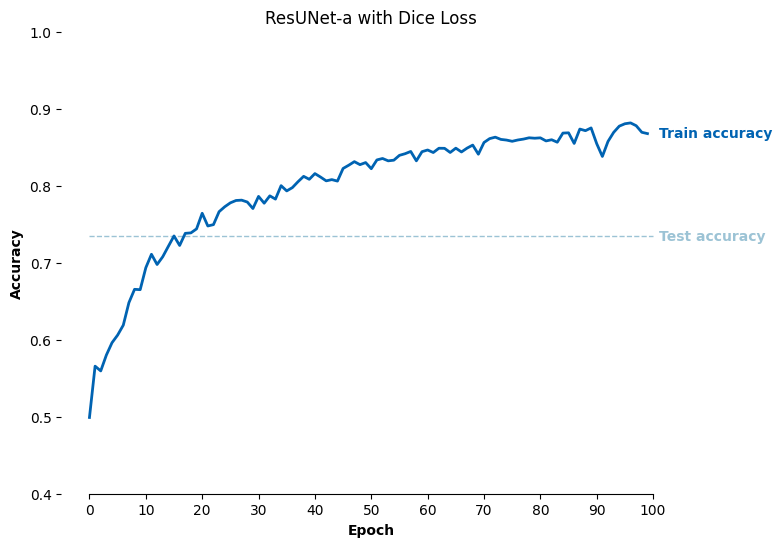

In [23]:
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(
    [0, EPOCHS], 
    [mean_test_acc, mean_test_acc],
    label="Test accuracy",
    color="#9CC3D5FF",
    linestyle="--",
    linewidth=1,
)

ax.text(
    EPOCHS * 1.01,
    mean_test_acc,
    "Test accuracy",
    color="#9CC3D5FF",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.plot(
    acc_list,
    label="Train accuracy",
    color="#0063B2FF",
    linewidth=2,
)

ax.text(
    EPOCHS * 1.01,
    acc_list[-1],
    "Train accuracy",
    color="#0063B2FF",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
ax.spines["bottom"].set_bounds(0, EPOCHS)

ax.set_xticks(np.arange(0, EPOCHS + 1, 10))
ax.set_yticks(np.arange(0.4, 1.1, 0.1))

ax.set_xlabel("Epoch", fontweight="bold")
ax.set_ylabel("Accuracy", fontweight="bold")

plt.title('ResUNet-a with Dice Loss')
plt.show()

Show the IOU score for each class

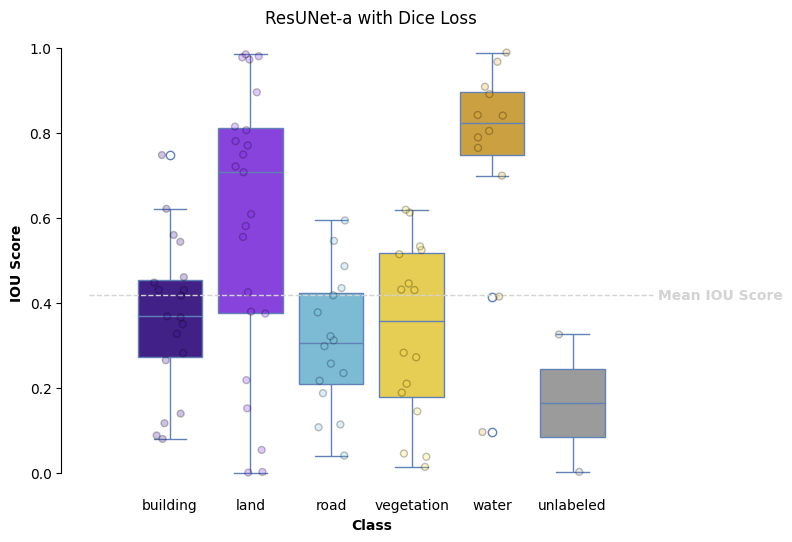

In [24]:
iou_scores = get_iou_by_class(iou_list)

fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    iou_scores,
    palette=['#3C1098', '#8429F6', '#6EC1E4', '#FEDD3A', '#E2A929', '#9B9B9B'],
    ax=ax,
    linecolor='#6082B6'
)
sns.stripplot(
    iou_scores,
    palette=['#3C1098', '#8429F6', '#6EC1E4', '#FEDD3A', '#E2A929', '#9B9B9B'],
    ax=ax,
    alpha=0.25,
    edgecolor='black',
    linewidth=1,
    jitter=0.2
)
ax.plot(
    [-1, 6], 
    [mean_iou_scores, mean_iou_scores],
    label="Test accuracy",
    color="lightgray",
    linestyle="--",
    linewidth=1,
)
ax.text(
    6 * 1.01,
    mean_iou_scores,
    "Mean IOU Score",
    color="lightgray",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.set_xticks(range(dataset.num_classes), dataset.mask_labels)
ax.tick_params(axis='x', length=0)

ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_bounds(0, 1)

ax.set_xlabel('Class', fontweight="bold")
ax.set_ylabel('IOU Score', fontweight="bold")

plt.title('ResUNet-a with Dice Loss')
plt.show()